## Import Libraries

In [1]:
#Import Libraries
import numpy as np
from random import sample
import pandas as pd
import matplotlib.pyplot as plt
from collections import deque
import math

## Import the Reward and Transition Matrix from the xls file

In [2]:
#Import the reward table and the transition matrix
r_table = pd.read_excel('environment_matrices.xlsx', sheet_name ='rewards', index_col=0)
state_value_function = pd.read_excel('environment_matrices.xlsx', sheet_name ='State value function')
transition_matrix = pd.read_excel('environment_matrices.xlsx', sheet_name ='transition',index_col=0)

## Initialize important parameters and Q matrix

In [3]:
#Initialize parameters
total_episodes = 10000 #Total episodes
number_of_steps = 100 #Maximum steps per episode
epsilon = 0.4 # Epsilon with constant value

#Q Learning parameters
alpha = 0.15 #Learning rate
gamma = 0.999 #Discount rate

#Initialization of the Q matrix
q_table = pd.DataFrame(np.matrix(np.zeros([16,4])).astype("float32"), columns = transition_matrix.columns, index = transition_matrix.index)
q_table.head()

,UP,DOWN,RIGHT,LEFT
A,0.0,0.0,0.0,0.0
B,0.0,0.0,0.0,0.0
C,0.0,0.0,0.0,0.0
D,0.0,0.0,0.0,0.0
E,0.0,0.0,0.0,0.0


In [4]:
#%% Define the optimal state value table
optimal_state_value_function = np.array(state_value_function)
optimal_state_value_function

array([[-6, -5, -4, -5],
       [-5,  0, -3,  0],
       [-4, -3, -2,  0],
       [ 0, -2, -1,  0]])

## Epsilon constant greedy policy

In [5]:
# ε-constant policy function

def e_constant_policy(state, epsilon):
    exploration_threshold = np.random.uniform(0,1)
    actions_list = ["UP", "DOWN", "RIGHT", "LEFT"]
    #With probability 1-ε choose the action with the highest q-value
    #e-constant policy implementation
    if (exploration_threshold >= epsilon):
        # Exploit: Then we choose the best action from the Q table
        action = q_table.loc[state, :].argmax()
    else:
        # Explore: We take a random action from the action list
        action = sample(actions_list, 1)[0]
    return action


## 'execute_action' Function

In [6]:
# Execution of the action selected from policy.
def execute_action(state, action):
    next_state = transition_matrix.loc[state,action] #return the next state
    reward = r_table.loc[state, next_state]
    end_episode_states = ['F', 'H', 'L', 'M', 'P']
    done = False #done is a flag to determine if my algorithm is going to terminate or not
    if (next_state in end_episode_states):
        done = True
    print('Current state', state)
    print('Next state', next_state)
    print ('Done', done)
    
    
    return next_state, reward, done

## 'update_Q' Function


In [7]:
#Update Q

def update_Q(current_state, next_state, action, reward, alpha, gamma):
    q_old = q_table.loc[current_state, action] #OLD Q value
    q_new = q_old + alpha * (reward + gamma * max(q_table.loc[next_state,:] - q_old))
    #q_new_values.append(q_new) # # add the new q value to a list with all the q new values
    q_table.loc[current_state, action] = q_new
    
    print('Old Q value:       ', q_old)
    print('Updated Q value (Q new): ', q_new)

## Train the agent

In [8]:
#Training the agent
sum_reward = 0
episodes_rewards_list_per_10 = []

#Main
episodes_rewards_list = []
window = 100
# initialize average rewards
average_reward = deque(maxlen=total_episodes)
# initialize best average reward as negative infinity
best_average_reward = -math.inf
# initialize monitor for most recent rewards
check_rewards = deque(maxlen=window)

#EPISODES
for episode in range(1, total_episodes + 1):
    current_state = 'A'
    episode_reward = 0
    # Decide the value of epsilon before the start of the episode
    for step in range (number_of_steps):
        #Choose action depending on the value of epsilon
        action = e_constant_policy(current_state, epsilon)
        
        #Execute Action and calculate the next state, the reward and check if the episode is finished
        next_state, reward, done = execute_action(current_state, action)
        
        # Update the Q Matrix based on the new values
        update_Q(current_state, next_state, action, reward, alpha, gamma)
        current_state = next_state #replace the current state with the value of the next state
        
        episode_reward += reward #calculate summary of rewards per episode
        
        if done:
            check_rewards.append(episode_reward)
            break
    
    #Calculate best average reward for early stopping purposes
    if episode >= 100:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   
        average_reward = np.mean(check_rewards)
        if average_reward > best_average_reward:
            best_average_reward = average_reward
    print("\rEpisode {}/{} || Best average reward {}".format(episode, total_episodes, best_average_reward), end="")

    if best_average_reward > 50:
        print('\nThe environment is solved in {} episodes.'.format(episode-1), end = "")
        break
    
    episodes_rewards_list.append(episode_reward)
    print("\rThe reward for this episode is: {}".format(episode_reward))
    
    episode_reward = 0

/Users/kgkolias/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: FutureWarning: 
The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.
  # Remove the CWD from sys.path while we load stuff.


Current state A
Next state A
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state A
Next state A
Done False
Old Q value:        -0.15
Updated Q value (Q new):  -0.27752250506728887
Current state A
Next state A
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state A
Next state E
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state E
Next state F
Done True
Old Q value:        0.0
Updated Q value (Q new):  -15.0
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state B
Next state B
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state B
Next state F
Done True
Old Q value:        0.0
Updated Q value (Q new):  -15.0
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        -0.15
Updated Q value (Q new):  -0.27752250506728887
Current state E
Next state

Old Q value:        -0.51969004
Updated Q value (Q new):  -0.6367694865494966
Current state D
Next state D
Done False
Old Q value:        -0.3
Updated Q value (Q new):  -0.450000011920929
Current state D
Next state C
Done False
Old Q value:        -0.32706875
Updated Q value (Q new):  -0.46964424176216124
Current state C
Next state G
Done False
Old Q value:        -0.2775225
Updated Q value (Q new):  -0.3859357570558786
Current state G
Next state C
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.2078324726745486
Current state C
Next state G
Done False
Old Q value:        -0.38593575
Updated Q value (Q new):  -0.47810328090935944
Current state G
Next state F
Done True
Old Q value:        0.0
Updated Q value (Q new):  -15.0
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        -1.1556278
Updated Q value (Q new):  -1.2854974192738533
Current state A
Next state A
Done False
Old Q value:        -1.0212907
Updated Q value (Q new): 

Old Q value:        -0.87752247
Updated Q value (Q new):  -1.0275224685668944
Current state B
Next state C
Done False
Old Q value:        -0.9477094
Updated Q value (Q new):  -1.0273389072686434
Current state C
Next state D
Done False
Old Q value:        -0.6367695
Updated Q value (Q new):  -0.758782070620358
Current state D
Next state D
Done False
Old Q value:        -0.45000002
Updated Q value (Q new):  -0.6000000178813935
Current state D
Next state C
Done False
Old Q value:        -0.46964425
Updated Q value (Q new):  -0.6209118343681097
Current state C
Next state G
Done False
Old Q value:        -0.47810328
Updated Q value (Q new):  -0.578937004442513
Current state G
Next state F
Done True
Old Q value:        -15.0
Updated Q value (Q new):  -27.75225
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        -1.4354974
Updated Q value (Q new):  -1.5811892420828342
Current state A
Next state E
Done False
Old Q value:        -1.4067476
Updated 

Updated Q value (Q new):  -0.9450144284784794
Current state G
Next state C
Done False
Old Q value:        -0.4262882
Updated Q value (Q new):  -0.6540193130195141
Current state C
Next state G
Done False
Old Q value:        -0.9450144
Updated Q value (Q new):  -1.020331775905192
Current state G
Next state K
Done False
Old Q value:        -0.44663176
Updated Q value (Q new):  0.03564096126556393
Current state K
Next state O
Done False
Old Q value:        3.7727392
Updated Q value (Q new):  10.221771465873719
Current state O
Next state P
Done True
Old Q value:        47.810326
Updated Q value (Q new):  55.645948328018186
The reward for this episode is: 81.0
Current state A
Next state A
Done False
Old Q value:        -1.9088845
Updated Q value (Q new):  -2.058884525299072
Current state A
Next state B
Done False
Old Q value:        -1.9641877
Updated Q value (Q new):  -2.0369925747156143
Current state B
Next state B
Done False
Old Q value:        -1.4490381
Updated Q value (Q new):  -1.5990

Updated Q value (Q new):  15.864445639419555
Current state K
Next state O
Done False
Old Q value:        34.05588
Updated Q value (Q new):  41.66445865497589
Current state O
Next state P
Done True
Old Q value:        85.831505
Updated Q value (Q new):  87.96965382423402
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        -2.3655593
Updated Q value (Q new):  -2.359449518316984
Current state B
Next state C
Done False
Old Q value:        -1.3237854
Updated Q value (Q new):  -0.985984321630001
Current state C
Next state G
Done False
Old Q value:        1.9314772
Updated Q value (Q new):  3.869332464790344
Current state G
Next state K
Done False
Old Q value:        15.864446
Updated Q value (Q new):  19.580577858543396
Current state K
Next state G
Done False
Old Q value:        2.1493409
Updated Q value (Q new):  4.611411622619629
Current state G
Next state K
Done False
Old Q value:        19.580578
Updated Q value (Q new):  22.739847474861143
Cu

Updated Q value (Q new):  8.16756864337921
Current state B
Next state C
Done False
Old Q value:        15.216336
Updated Q value (Q new):  17.50732429161072
Current state C
Next state G
Done False
Old Q value:        31.505878
Updated Q value (Q new):  35.065874379348756
Current state G
Next state K
Done False
Old Q value:        56.263943
Updated Q value (Q new):  59.48482859783173
Current state K
Next state O
Done False
Old Q value:        78.75901
Updated Q value (Q new):  81.3109542564392
Current state O
Next state P
Done True
Old Q value:        96.79
Updated Q value (Q new):  97.28601927833557
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        8.167568
Updated Q value (Q new):  9.417130645179748
Current state B
Next state C
Done False
Old Q value:        17.507324
Updated Q value (Q new):  19.988473204231262
Current state C
Next state C
Done False
Old Q value:        -1.1584132
Updated Q value (Q new):  4.119796525955199
Current state

Old Q value:        1.0400211
Updated Q value (Q new):  5.2027044506073
Current state A
Next state A
Done False
Old Q value:        5.2027044
Updated Q value (Q new):  8.741609983634948
Current state A
Next state A
Done False
Old Q value:        8.74161
Updated Q value (Q new):  11.750210048675537
Current state A
Next state B
Done False
Old Q value:        29.820024
Updated Q value (Q new):  32.21974187021255
Current state B
Next state B
Done False
Old Q value:        -2.1529806
Updated Q value (Q new):  5.03789165725708
Current state B
Next state C
Done False
Old Q value:        46.835155
Updated Q value (Q new):  49.63386112499237
Current state C
Next state G
Done False
Old Q value:        66.51287
Updated Q value (Q new):  68.90036752548218
Current state G
Next state F
Done True
Old Q value:        -62.3074
Updated Q value (Q new):  -67.97063589725494
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        32.21974
Updated Q value (Q new): 

Old Q value:        90.85409
Updated Q value (Q new):  91.67158135795593
Current state K
Next state O
Done False
Old Q value:        97.3105
Updated Q value (Q new):  97.54712351913452
Current state O
Next state P
Done True
Old Q value:        99.890564
Updated Q value (Q new):  99.92196295471192
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        65.020256
Updated Q value (Q new):  66.66533149986267
Current state B
Next state C
Done False
Old Q value:        76.999405
Updated Q value (Q new):  78.17033988265992
Current state C
Next state D
Done False
Old Q value:        1.7844508
Updated Q value (Q new):  4.408947150707245
Current state D
Next state H
Done True
Old Q value:        -55.645947
Updated Q value (Q new):  -62.30740141925812
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        11.0075245
Updated Q value (Q new):  19.19784677886963
Current state A
Next state E
Done False
Old Q value:  

Old Q value:        80.95823
Updated Q value (Q new):  81.75904921989441
Current state B
Next state B
Done False
Old Q value:        38.95892
Updated Q value (Q new):  46.05333621463775
Current state B
Next state C
Done False
Old Q value:        87.303375
Updated Q value (Q new):  87.88102668609619
Current state C
Next state B
Done False
Old Q value:        36.262997
Updated Q value (Q new):  43.847958551216124
Current state B
Next state F
Done True
Old Q value:        -87.96965
Updated Q value (Q new):  -89.78739817581177
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        81.75905
Updated Q value (Q new):  82.52642697906494
Current state B
Next state C
Done False
Old Q value:        87.88103
Updated Q value (Q new):  88.37211751480102
Current state C
Next state G
Done False
Old Q value:        92.15924
Updated Q value (Q new):  92.6545988231659
Current state G
Next state K
Done False
Old Q value:        96.465935
Updated Q value (Q new):

Done False
Old Q value:        93.15586
Updated Q value (Q new):  93.41753110923767
Current state C
Next state G
Done False
Old Q value:        95.903076
Updated Q value (Q new):  96.01741384925842
Current state G
Next state F
Done True
Old Q value:        -83.316475
Updated Q value (Q new):  -85.83150114860534
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        90.07953
Updated Q value (Q new):  90.42972886772155
Current state B
Next state C
Done False
Old Q value:        93.417534
Updated Q value (Q new):  93.65712535362243
Current state C
Next state D
Done False
Old Q value:        18.975496
Updated Q value (Q new):  23.00449115743637
Current state D
Next state C
Done False
Old Q value:        46.86335
Updated Q value (Q new):  54.079085860061646
Current state C
Next state G
Done False
Old Q value:        96.01741
Updated Q value (Q new):  96.11461498985291
Current state G
Next state K
Done False
Old Q value:        97.66709
Updated Q v

Done False
Old Q value:        96.68954
Updated Q value (Q new):  96.72637509346008
Current state G
Next state C
Done False
Old Q value:        35.686123
Updated Q value (Q new):  44.68300418758392
Current state C
Next state G
Done False
Old Q value:        96.72637
Updated Q value (Q new):  96.75769012794494
Current state G
Next state K
Done False
Old Q value:        97.93637
Updated Q value (Q new):  97.95595016975403
Current state K
Next state O
Done False
Old Q value:        99.06803
Updated Q value (Q new):  99.07214454536438
Current state O
Next state K
Done False
Old Q value:        69.212906
Updated Q value (Q new):  73.5373126487732
Current state K
Next state G
Done False
Old Q value:        78.87028
Updated Q value (Q new):  81.58026512489319
Current state G
Next state K
Done False
Old Q value:        97.95595
Updated Q value (Q new):  97.9732097984314
Current state K
Next state O
Done False
Old Q value:        99.07214
Updated Q value (Q new):  99.07564056930542
Current stat

Old Q value:        96.987656
Updated Q value (Q new):  96.99755722351074
Current state G
Next state C
Done False
Old Q value:        52.365814
Updated Q value (Q new):  58.903881105041506
Current state C
Next state B
Done False
Old Q value:        51.40481
Updated Q value (Q new):  57.910608392143246
Current state B
Next state F
Done True
Old Q value:        -96.79
Updated Q value (Q new):  -97.28601927833557
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        65.653625
Updated Q value (Q new):  69.82010623092651
Current state A
Next state B
Done False
Old Q value:        94.45897
Updated Q value (Q new):  94.51310018424988
Current state B
Next state A
Done False
Old Q value:        20.3389
Updated Q value (Q new):  31.30390377693176
Current state A
Next state B
Done False
Old Q value:        94.5131
Updated Q value (Q new):  94.55911927490234
Current state B
Next state A
Done False
Old Q value:        31.303904
Updated Q value (Q new):  

Current state C
Next state G
Done False
Old Q value:        97.067726
Updated Q value (Q new):  97.07069038848877
Current state G
Next state K
Done False
Old Q value:        98.08851
Updated Q value (Q new):  98.08961505393982
Current state K
Next state J
Done False
Old Q value:        13.879761
Updated Q value (Q new):  20.63971532306671
Current state J
Next state N
Done False
Old Q value:        59.992237
Updated Q value (Q new):  64.81715659809113
Current state N
Next state J
Done False
Old Q value:        13.223281
Updated Q value (Q new):  20.804622636413573
Current state J
Next state F
Done True
Old Q value:        -15.0
Updated Q value (Q new):  -27.75225
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        94.9161
Updated Q value (Q new):  94.93193696289063
Current state B
Next state C
Done False
Old Q value:        96.02279
Updated Q value (Q new):  96.02981756095886
Current state C
Next state G
Done False
Old Q value:        97.07

Old Q value:        99.09815
Updated Q value (Q new):  99.09828111724853
Current state O
Next state K
Done False
Old Q value:        85.26467
Updated Q value (Q new):  87.18763786430358
Current state K
Next state O
Done False
Old Q value:        99.09828
Updated Q value (Q new):  99.09839138145446
Current state O
Next state P
Done True
Old Q value:        100.10001
Updated Q value (Q new):  100.10002667503358
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.06055
Updated Q value (Q new):  95.06349626579285
Current state B
Next state A
Done False
Old Q value:        55.389908
Updated Q value (Q new):  61.18499554023742
Current state A
Next state A
Done False
Old Q value:        79.08783
Updated Q value (Q new):  81.3317837184906
Current state A
Next state B
Done False
Old Q value:        95.0635
Updated Q value (Q new):  95.06600639801026
Current state B
Next state A
Done False
Old Q value:        61.184994
Updated Q value (Q new):  66.

Old Q value:        80.50434
Updated Q value (Q new):  82.53949852256775
Current state A
Next state A
Done False
Old Q value:        86.24735
Updated Q value (Q new):  87.42191972770691
Current state A
Next state B
Done False
Old Q value:        95.08664
Updated Q value (Q new):  95.08721080436706
Current state B
Next state A
Done False
Old Q value:        76.89596
Updated Q value (Q new):  79.47191730804444
Current state A
Next state A
Done False
Old Q value:        87.42192
Updated Q value (Q new):  88.42056460762024
Current state A
Next state B
Done False
Old Q value:        95.08721
Updated Q value (Q new):  95.08769726409912
Current state B
Next state C
Done False
Old Q value:        96.09145
Updated Q value (Q new):  96.0918191646576
Current state C
Next state D
Done False
Old Q value:        70.836136
Updated Q value (Q new):  73.21337751617432
Current state D
Next state C
Done False
Old Q value:        87.70128
Updated Q value (Q new):  88.95891200256348
Current state C
Next st

Next state K
Done False
Old Q value:        98.09783
Updated Q value (Q new):  98.0978646484375
Current state K
Next state L
Done True
Old Q value:        -72.78523
Updated Q value (Q new):  -76.87836544723511
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.092255
Updated Q value (Q new):  95.0924407585144
Current state B
Next state C
Done False
Old Q value:        96.0945
Updated Q value (Q new):  96.09463806991577
Current state C
Next state G
Done False
Old Q value:        97.096436
Updated Q value (Q new):  97.09649933738709
Current state G
Next state K
Done False
Old Q value:        98.09786
Updated Q value (Q new):  98.09789059295655
Current state K
Next state J
Done False
Old Q value:        33.22484
Updated Q value (Q new):  38.966057610702514
Current state J
Next state K
Done False
Old Q value:        14.152011
Updated Q value (Q new):  26.73132551689148
Current state K
Next state O
Done False
Old Q value:        99.09905
Up

Old Q value:        96.09568
Updated Q value (Q new):  96.09571887550354
Current state C
Next state B
Done False
Old Q value:        88.846855
Updated Q value (Q new):  89.7830973171234
Current state B
Next state C
Done False
Old Q value:        96.09572
Updated Q value (Q new):  96.09575130615234
Current state C
Next state D
Done False
Old Q value:        79.33077
Updated Q value (Q new):  81.03582238388061
Current state D
Next state C
Done False
Old Q value:        91.71015
Updated Q value (Q new):  92.36736176643372
Current state C
Next state G
Done False
Old Q value:        97.09694
Updated Q value (Q new):  97.0969502872467
Current state G
Next state K
Done False
Old Q value:        98.098015
Updated Q value (Q new):  98.09802031555176
Current state K
Next state L
Done True
Old Q value:        -83.316475
Updated Q value (Q new):  -85.83150114860534
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        90.60607
Updated Q value (Q new):  

Current state B
Next state C
Done False
Old Q value:        96.095924
Updated Q value (Q new):  96.09593557777404
Current state C
Next state G
Done False
Old Q value:        97.097
Updated Q value (Q new):  97.09700446281433
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        92.54478
Updated Q value (Q new):  92.77690059013366
Current state A
Next state B
Done False
Old Q value:        95.09482
Updated Q value (Q new):  95.09483503189087
Current state B
Next state B
Done False
Old Q value:        94.07939
Updated Q value (Q new):  94.23157007751465
Current state B
Next state C
Done False
Old Q value:      

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        93.97878
Updated Q value (Q new):  94.59605507965088
Current state K
Next state J
Done False
Old Q value:        43.846954
Updated Q value (Q new):  48.94048562545776
Current state J
Next state N
Done False
Old Q value:        78.83882
Updated Q value (Q new):  81.39059729270934
Current state N
Next state O
Done False
Old Q value:        96.86869
Updated Q value (Q new):  97.20291342468262
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -99.99065
Updated Q value (Q new):  -

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        93.40595
Updated Q value (Q new):  93.50905069503784
Current state A
Next state E
Done False
Old Q value:        58.106453
Updated Q value (Q new):  60.60739927177429
Current state E
Next state A
Done False
Old Q value:        75.79712
Updated Q value (Q new):  78.53890105400086
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Current state A
Next state A
Done False
Old Q value:        93.081726
Updated Q value (Q new):  93.23340963859557
Current state A
Next state A
Done False
Old Q value:        93.233406
Updated Q value (Q new):  93.3623603843689
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.03285
Updated Q value (Q new):  -100.04292927474975
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        91.21887
Updated Q value (Q new):  91.94971070213317
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:  

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        94.9247
Updated Q value (Q new):  94.95021531333923
Current state B
Next state A
Done False
Old Q value:        93.00507
Updated Q value (Q new):  93.1682434928894
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.

Old Q value:        94.392525
Updated Q value (Q new):  94.64779150161743
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        95.94624
Updated Q value (Q new):  96.26869173622131
Current state K
Next state J
Done False
Old Q value:        69.447014
Updated Q value (Q new):  72.66858626480102
Current state J
Next state F
Done True
Old Q value:        -27.75225
Updated Q value (Q new):  -38.59357590827942
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.01058
Updated Q value (Q new):  94.02307647857666
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Ne

Old Q value:        98.78115
Updated Q value (Q new):  98.82879157180786
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0
Current state A
Next state A
Done False
Old Q value:        93.97129
Updated Q value (Q new):  93.98967291030884
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        94.512794
Updated Q value (Q new):  9

Current state K
Next state L
Done True
Old Q value:        -97.70771
Updated Q value (Q new):  -98.0662098827362
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        90.23942
Updated Q value (Q new):  90.58994277610779
Current state E
Next state A
Done False
Old Q value:        93.57959
Updated Q value (Q new):  93.65666852226258
Current state A
Next state A
Done False
Old Q value:        94.05459
Updated Q value (Q new):  94.06048847503662
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:     

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -98.06621
Updated Q value (Q new):  -98.37098663406373
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        91.412895
Updated Q value (Q new):  91.61729241905212
Current state E
Next state A
Done False
Old Q value:        93.77791
Updated Q value (Q new):  93.8252689792633
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.06644
Updated Q value (Q new):  95.0707146320343
Current state B
Next state A
Done False
Old Q value:        93.91139
Updated Q value (Q new):  93.93875030555725
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.0845
Updated Q value (Q new):  -1

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.07072
Updated Q value (Q new):  95.07435335083008
Current state B
Next state B
Done False
Old Q value:        95.074356
Updated Q value (Q new):  95.07744723472595
Current state B
Next state F
Done True
Old Q value:     

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -99.03765
Updated Q value (Q new):  -99.19685905036926
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.08321
Updated Q value (Q new):  94.08482443389893
Current state A
Next state A
Done False
Old Q value:        94.08482
Updated Q value (Q new):  94.08619300727844
Current state A
Next state E
Done False
Old Q value:        92.22315
Updated Q value (Q new):  92.32875300865173
Current state E
Next state A
Done False
Old Q value:    

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:      

Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        92.42223
Updated Q value (Q new):  92.50486166725159
Current state E
Next state I
Done False
Old Q value:        28.072863
Updated Q value (Q new):  33.014719254302975
Current state I
Next state J
Done False
Old Q value:        62.052555
Updated Q value (Q new):  67.15299111156463
Current state J
Next state N
Done False
Old Q value:        97.0905
Updated Q value (Q new):  97.23208955764771
Current state N
Next state O
Done False
Old Q value:        99.03638
Updated Q value (Q new):  99.04577207069397
Current sta

Old Q value:        -100.09648
Updated Q value (Q new):  -100.09702359695434
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09148
Updated Q value (Q new):  94.09184891242981
Current state A
Next state A
Done False
Old Q value:        94.09185
Updated Q value (Q new):  94.09216673278809
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new)

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        96.11355
Updated Q value (Q new):  96.26092287826538
Current state G
Next state C
Done False
Old Q value:        95.70082
Updated Q value (Q new):  95.76003951911926
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        95.81039
Updated Q value (Q new):  95.85318682861327
Current state C
Next state B
Done False
Old Q value:        94.94565
Updated Q value (Q new):  94.96802622566223
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.07183
Updated Q value (Q new):  94.0751471282959
Current state A
Next state E
Done False
Old Q value:      

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.038605
Updated Q value (Q new):  95.04705323066712
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        98.62658
Updated Q value (Q new):  98.69738258285523
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this 

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        92.94275
Updated Q value (Q new):  92.95951934204102
Current state E
Next state A
Done False
Old Q value:        94.055664
Updated Q value (Q new):  94.06140301933289
Current state A
Next state E
Done False
Old Q value:        92.95952
Updated Q value (Q new):  92.97463559036255
Current state E
Next state F
Done True
Old Q value:     

Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09321
Updated Q value (Q new):  94.0933212638855
Current state A
Next state E
Done False
Old Q value:        92.98749
Updated Q value (Q new):  92.99914543151856
Current state E
Next state A
Done False
Old Q value:        94.066284
Updated Q value (Q new):  94.07043171195984
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:      

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.08685
Updated Q value (Q new):  94.0879183177948
Current state A
Next state E
Done False
Old Q value:        93.00968
Updated Q value (Q new):  93.01863551902771
Current state E
Next state F
Done True
Old Q value:        -92.646545
Updated Q value (Q new):  -93.76346058044433
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:     

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        95.9589
Updated Q value (Q new):  95.9794458305359
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09391150169373
Current state A
Next state B
Done False
Old Q value:        

Current state O
Next state N
Done False
Old Q value:        96.800674
Updated Q value (Q new):  96.9935143913269
Current state N
Next state J
Done False
Old Q value:        66.59603
Updated Q value (Q new):  71.12824118843079
Current state J
Next state K
Done False
Old Q value:        46.51739
Updated Q value (Q new):  54.24675313930511
Current state K
Next state L
Done True
Old Q value:        -99.92197
Updated Q value (Q new):  -99.94865986480713
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        93.04939
Updated Q value (Q new):  93.05375516624451
Current state E
Next state A
Done False
Old Q value:        94.079506
Updated Q value (Q new):  94.0816721748352
Current state A
Next state A
Done False
Old Q value:        94.093796
Updated Q value (Q new):  94.09382069587707
Current state A
Next state E
Done False
Old Q value:        93.05376
Updated Q value (Q new):  93.05778991966247
Current state E
Next state A
Done False
Old Q value:   

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        96.725716
Updated Q value (Q new):  96.78135695800782
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state E
Done False
Old Q value:        93.07074
Updated Q value (Q new):  93.07325126647949
Current state E
Next state A
Done False
Old Q value:        94.0885
Updated Q value (Q new):  94.08931932182313
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.07024
Updated Q value (Q new):  -100.07471131057738
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B

Old Q value:        95.09493
Updated Q value (Q new):  95.09494032669068
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.08684
Updated Q value (Q new):  -100.08882512893676
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.08815
Updated Q value (Q new):  95.08917415733337
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.08917
Updated Q value (Q new): 

Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.09421
Updated Q value (Q new):  -100.09509073028565
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        93.084946
Updated Q value (Q new):  93.08588406677246
Current state 

Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.00705
Updated Q value (Q new):  -100.02099318389892
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.093925
Updated Q value (Q new):  94.09393096008301
Current state A
Next state E
Done False
Old Q value:        93.0874
Updated Q value (Q new):  93.08804462623596
Current state E
Next state A
Done False
Old Q value:        94.09269
Updated Q value (Q new):  94.09288020706177
Current state A
Next state A
Done False
Old Q value:        94.09394
U

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:     

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09167
Updated Q value (Q new):  95.09211395950318
Current state D
Next state H
Done True
Old Q value:        -91.332756
Updated Q value (Q new):  -92.64654254951478
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current stat

Current state D
Next state C
Done False
Old Q value:        96.09575
Updated Q value (Q new):  96.09578754005432
Current state C
Next state D
Done False
Old Q value:        95.09312
Updated Q value (Q new):  95.09336690292358
Current state D
Next state C
Done False
Old Q value:        96.09579
Updated Q value (Q new):  96.09581997070312
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.06658
Updated Q value (Q new):  96.070991065979
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.09849
Updated Q value (Q new):  -100.09872944908142
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:    

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.06916
Updated Q value (Q new):  99.07364297027588
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.09317
Updated Q value (Q new):  -

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value: 

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:     

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09421
Updated Q value (Q new):  95.09431499824524
Current state D
Next state C
Done False
Old Q value:        96.095924
Updated Q value (Q new):  96.09593672103883
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.07474
Updated Q value (Q new

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.05203
Updated Q value (Q new):  97.05877521400451
Current state G
Next state F
Done True
Old Q value:        -100.09973
Updated Q value (Q new):  -100.09978668823243
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        93.092255
Updated Q value (Q new):  93.09233786468506
Current state E
Next state F
Done True
Old Q value:        -94.713005
Updated Q value (Q new):  -95.52026125679016
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:

Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09472
Updated Q value (Q new):  95.0947575717926
Current state D
Next state C
Done False
Old Q value:        96.09598
Updated Q value (Q new):  96.09598212394714
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.099785
Updated Q value (Q new):  -100.09983209114074
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current st

Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.06451
Updated Q value (Q new):  97.06938003616332
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.08176
Updated Q value (Q new):  -100.08450536651611
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        93.09247
Updated Q value (Q new):  93.09251947631836
Current state E
Next state F
Done True
Old Q value:        -96.20655
Updated Q value (Q new):  -96.78999899101257
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:      

Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        93.092674
Updated Q value (Q new):  93.0927060344696
Current state E
Next state A
Done False
Old Q value:        94.09389
Updated Q value (Q new):  94.0938985294342
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:      

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.094894
Updated Q value (Q new):  95.09490789604187
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.089424
Updated Q value (Q new):  98.09071693344116
Current state K
Next state L
Done True
Old Q value:        -100.09317
Updated Q value (Q new):

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.094925
Updated Q value (Q new):  95.09493384056091
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.09584
Updated Q value (Q new):  -100.09647876205445
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.07499
Updated Q value (Q new):  98.07844060287475
Current state N
Next state O
Done False
Old Q value:        99.09902
Updated Q value (Q new):  99.09902968215943
Current state O
Next state N
Done False
Old Q value:        98.07844
Updated Q value (Q new):  9

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        93.09285
Updated Q value (Q new):  93.0928632183075
Current state E
Next state F
Done True
Old Q value:        -96.79
Updated Q value (Q new):  -97.28601927833557
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.09598
Updated Q value (Q new):  96.09598212394714
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.099495
Updated Q value (Q new):  -100.09958561820984
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:  

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        96.09297
Updated Q value (Q new):  96.09342658882142
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09809
Updated Q value (Q new):  99.09823837432862
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Upda

Done True
Old Q value:        -100.09959
Updated Q value (Q new):  -100.09966345176697
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.09966
Updated Q val

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.099785
Updated Q value (Q new):  -100.09983209114074
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Done False
Old Q value:        97.05596
Updated Q value (Q new):  97.06181374893188
Current state J
Next state N
Done False
Old Q value:        98.096016
Updated Q value (Q new):  98.09632094955444
Current state N
Next state N
Done False
Old Q value:        84.03458
Updated Q value (Q new):  86.14198814659119
Current state N
Next state J
Done False
Old Q value:        89.975876
Updated Q value (Q new):  91.04272457542419
Current state J
Next state N
Done False
Old Q value:        98.09632
Updated Q value (Q new):  98.09658039474488
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q valu

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.09994
Updated Q value (Q new):  -100.09996181373596
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:   

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09741
Updated Q value (Q new):  98.09750791130065
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:     

Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:     

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Ne

Current state K
Next state J
Done False
Old Q value:        97.08525
Updated Q value (Q new):  97.0869689491272
Current state J
Next state F
Done True
Old Q value:        -89.7874
Updated Q value (Q new):  -91.33275750808716
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:      

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09895
Updated Q value (Q new):  99.09897130699157
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.10007
Updated Q value (Q new):  -100.10007207794189
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:  

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new)

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state

Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803


The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K


Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state F
Done True
Old Q value:        -98.85038
Updated Q value (Q new):  -99.03765050926208
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
N

The reward for this episode is: 90.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09796
Updated Q value (Q new):  98.09797491264344
Current state N
Next state O
Done False
Old Q value:       

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next st

Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:     

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:      

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.095314
Updated Q value (Q new):  97.0955710281372
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state 

Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:     

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next st

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  1

Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q 

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value: 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.096886
Updated Q value (Q new):  97.09690717086792
Current state J
Next s

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value: 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new)

Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q v

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state 

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -116.0
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state I
Done False
Old Q value:        89.90175
Updated Q value (Q new):  90.76290461044312
Current state I
Next state M
Done True
Old Q value:        -67.970634
Updated Q value (Q new)

Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value: 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.097
Updated Q value (Q new):  97.09700446281433
Current state J
Next state I
Done False
Old Q value:        85.663414
Updated Q value (Q new):  87.19171296539307
Current state I
Next state I
Done False
Old Q value:        52.132736
Updated Q value (Q new):  58.68560723762512
Current state I
Next state I
Done False
Old Q value:        58.685608
Updated Q value (Q new):  64.25653111686707
Current state I
Next state J
Done False
Old Q value:        96.86327
Updated Q value (Q new):  96.898301877594
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current st

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:     

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:     

Old Q value:        88.5045
Updated Q value (Q new):  89.62379276199341
Current state I
Next state J
Done False
Old Q value:        96.974915
Updated Q value (Q new):  96.99321341438294
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):

Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:     

Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        97.70269
Updated Q value (Q new):  97.76193501586914
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q valu

Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value: 

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        97.76193
Updated Q value (Q new):  97.81229981346131
Current state N
Next state J
Done False
Old Q value:        96.86152
Updated Q value (Q new):  96.89681006774903
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -99.545105
Updated Q value (Q new):  -99.62827099914551
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:

Old Q value:        -98.06621
Updated Q value (Q new):  -98.37098663406373
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state E
Next state F
Done True
Old Q value:        -99.99065
Updated Q value (Q new):  -100.00704800491333
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current sta

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state

Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:  

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q valu

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -99.92197
Updated Q value (Q new):  -99.94865986480713
The reward for this ep

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:  

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:     

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:      

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value: 

Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        93.58032
Updated Q value (Q new):  94.25730398063659
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        93.179016
Updated Q value (Q new):  93.26522604751587
Current state E
Next state I
Done False
Old Q value:        94.755325
Updated Q value (Q new):  94.95035690879821
Current state I
Next state J
Done False
Old Q value:        97.05784
Updated Q value (Q new):  97.06371115875244
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        93.47999
Updated Q value (Q new):  93.59683867149353
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        94.19108
Updated Q value (Q new):  94.26970713157654
Current state E
Next state I
Done False
Old Q value:        95.7168
Updated Q value (Q new):  95.77226213302612
Current state I
Next state J
Done False
Old Q value:        97.08794
Updated Q value (Q new):  97.08929894065857
Current state J
Next state K
Done False
Old Q value:        95.32213
Updated Q value (Q new):  95.73810037727355
Current state K
Next sta

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        94.69065
Updated Q value (Q new):  94.73516829452515
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Upd

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:  

Old Q value:        74.07286
Updated Q value (Q new):  77.21129948654175
Current state E
Next state I
Done False
Old Q value:        96.01773
Updated Q value (Q new):  96.02909110260009
Current state I
Next state J
Done False
Old Q value:        97.09454
Updated Q value (Q new):  97.09491592903137
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        94.971214
Updated Q value (Q new):  94.98441534042358
Current state E
Next state I
Done False
Old Q value:        96.06031
Updated Q value (Q new):  96.06546739883423
Current state I
Next state M
Done True
Old Q value:     

Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        94.80406
Updated Q value (Q new):  94.84765662956238
Current state D
Next state C
Done False
Old Q value: 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:  

Next state J
Done False
Old Q value:        97.09609
Updated Q value (Q new):  97.0962326133728
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updat

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:      

Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:      

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.06375
Updated Q value (Q new):  95.06729510917664
Current state E
Next state E
Done False
Old Q value:        93.37208
Updated Q value (Q new):  93.62911907119751
Current state E
Next state A
Done False
Old Q valu

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new)

Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:     

Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:     

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.078
Updated Q value (Q new):  95.08002284622192
Current state E
Next state I
Done False
Old Q value:        96.09248
Updated Q value (Q new):  96.09298632469178
Current state I
Next state J
Done False
Old Q value:        97.09684
Updated Q value (Q new):  97.09686825408936
Current state J
Next state F
Done True
Old Q value:        -99.332214
Updated Q value (Q new):  -99.44728203430176
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Ne

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:     

Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 85.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:     

Old Q value:        96.093796
Updated Q value (Q new):  96.09411337165832
Current state I
Next state J
Done False
Old Q value:        97.09692
Updated Q value (Q new):  97.09693311538696
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this 

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value: 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.07852
Updated Q value (Q new):  -100.08175524749755
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.08605
Updated Q value (Q new):  95.08715152931214
Current state E
Next state I
Done False
Old Q value:        96.09439
Updated Q value (Q new):  96.09462386283874
Current state I
Next state J
Done False
Old Q value:        97.09695
Updated Q value (Q new):  97.09695905990601
Current state J
Next state F
Done True
Old Q value:        -99.545105
Updated Q value (Q new):  -99.62827099914551
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value: 

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q val

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Current state N
Next state M
Done True
Old Q value:        -100.0845
Updated Q value (Q new):  -100.08684037322998
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current stat

Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.08684
Updated Q value (Q new):  -100.08882512893676
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.07276
Updated Q value (Q new):

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09397
Updated Q value (Q new):  95.0941082118988
Current state E
Next state A
Done False
Old Q value:      

Old Q value:        96.0959
Updated Q value (Q new):  96.09591726264954
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.08882
Updated Q value (Q new):  -100.09051152267456
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  1

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09448
Updated Q value (Q new):  95.09455078544617
Current state E
Next state E
Done False
Old Q value:        94.19402
Updated Q value (Q new):  94.32902532043457
Current state E
Next state I
Done False
Old Q value:        96.09594
Updated Q value (Q new):  96.09594969329834
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Upda

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:     

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.0764
Updated Q value (Q new):  97.07949191246033
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -99.92197
Updated Q value (Q new):  -99.94865986480713
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09002
Updated Q value (Q new):  98.0912228515625
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this ep

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Done False
Old Q value:        94.80579
Updated Q value (Q new):  94.84912898101807
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.04293
Updated Q value (Q new):  -100.0514974521637
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.090515
Updated Q value (Q new):  -100.09195144348145
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
O

Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        88.70431
Updated Q value (Q new):  89.81195368041992
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        90.75362
Updated Q value (Q new):  91.5541735370636
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.0156
Updated Q value (Q new):  95.02749754943848
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next sta

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -99.545105
Updated Q value (Q new):  -99.62827099914551
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:   

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.090515
Updated Q value (Q new):  

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.09317
Updated Q value (Q new):  -100.09420861663818
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        94.399254
Updated Q value (Q new):  94.50350907058716
Current state E
Next state E
Done False
Old Q value:        95.02789
Updated Q value (Q new):  95.03794670448303
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value: 

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.03795
Updated Q value (Q new):  95.0464954235077
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09619
Updated Q value (Q new):  98.09647013053895
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:       

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.09509
Updated Q value (Q new):  -100.0958431213379
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:    

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09491
Updated Q value (Q new):  97.09522726325989
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09523
Updated Q value (Q new):  97.09549968070984
Current state J
Next state F
Done True
Old Q value:        -100.09648
Updated Q value (Q new):  -100.09702359695434
The reward for this episode is: -116.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.09973
Updated Q value (Q new):  -100.09978668823243
The reward for this episode is: -101.0
Current stat

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -99.99065
Updated Q value (Q new):  -100.00704800491333
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.09994
Updated Q value (Q new):  -100.09996181373596
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.095924
Updated Q value (Q new):  97.09608991851806
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current stat

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.09787
Updated Q value (Q new):  -100.09820407257081
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.06972
Updated Q value (Q new):  96.07365686531067
Current state I
Next state M
Done True
Old Q value:   

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.086075
Updated Q value (Q new):  96.0875631275177
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09754
Updated Q value (Q new):  98.0976181755066
Current state N
Next state M
Done True
Old Q value:        -100.09849
Updated Q value (Q new):  -100.09872944908142
The reward for this e

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.08912
Updated Q value (Q new):  95.08999789581299
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09
Updated Q value (Q new):  95.09074380073547
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.09894
Updated Q value (Q new):  -100.09911213073731
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new): 

Old Q value:        95.092766
Updated Q value (Q new):  95.09309826583862
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value: 

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09667
Updated Q value (Q new):  97.09672555923461
Current state J
Next state I
Done False
Old Q value:        96.09405
Updated Q value (Q new):  96.09434113311768
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next st

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):

Updated Q value (Q new):  -100.09966345176697
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value 

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.097984
Updated Q value (Q new):  98.09799437103271
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The rewar

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.099785
Updated Q value (Q new):  -100.09983209114074
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:  

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.09994
Updated Q value (Q new):  -100.09996181373596
The reward for this episode is: -114.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09689
Updated Q value (Q new):  97.09691365699769
Current state J
Next state K
Done False
Old Q value:        98.09647
Updated Q value (Q new):  98.0967101173401
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09454
Updated Q value (Q new):  95.09460953407287
Current state E
Next state E
Done False
Old Q value:        95.09461
Updated Q value (Q new):  95.09466790924073
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.09514
Updated Q value (Q new):  96.09526864967346
Current state I
Next state M
Done True
Old Q value:        -100.099785
Updated Q value (Q new):  -100.09983209114074
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.10004
Updated Q value (Q new):  -100.10004613342285
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new): 

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.09492086830139
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current st

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095474
Updated Q value (Q new):  96.09555403938293
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.10006
Updated Q value (Q new):  -100.10006559181214
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new): 

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.093414
Updated Q value (Q new):  96.09380278434753
Current state I
Next state M
Done True
Old Q value:        -100.1
Updated Q value (Q new):  

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:  

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09393
Updated Q value (Q new):  95.09409064369201
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.09595
Updated Q value (Q new):  96.0959561794281
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.09596
Updated Q value (Q new):  96.09596915168763
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value

Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.09598
Updated Q value (Q new):  96.09598212394714
Current state I
Next state I
Done False
Old Q value:        96.09578
Updated Q value (Q new):  96.09581348457337
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:  

Current state J
Next state K
Done False
Old Q value:        98.097946
Updated Q value (Q new):  98.09796194038391
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:    

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09798
Updated Q value (Q new):  98.09798788490295
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09482
Updated Q value (Q new):  95.09484303474426
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09799
Updated Q value (Q new):  98.09800085716248
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:     

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q valu

Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09802
Updated Q value (Q new):  98.09802680168151
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Upd

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current st

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next st

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:  

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q valu

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new)

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
D

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:     

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current st

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state 

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 83.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Upda

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:     

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q val

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:     

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current st

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current st

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Upda

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q valu

Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  1

The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state 

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -113.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:  

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Upd

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0
Current state A
Next state E
Done False
Old Q value:     

Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current stat

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:     

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q valu

Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value 

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current st

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.100078564071

Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The re

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current s

Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:  

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state 

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:      

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q valu

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next st

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state

Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current sta

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Upda

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:     

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value: 

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current s

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:  

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q valu

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q valu

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state 

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value: 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state A
Done False
Old Q value:     

Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:  

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:     

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current s

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current st

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q val

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state 

Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:  

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:      

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q valu

Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q

Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q val

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Upda

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this ep

Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:   

Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current s

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Upda

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q valu

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q valu

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value: 

Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q val

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new)

Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496


Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:  

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current st

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:      

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.100078564071

Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q 

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:     

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current st

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q val

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:      

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q ne

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q valu

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current st

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state 

The reward for this episode is: 87.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:  

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:      

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 27.83
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 85.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q valu

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The r

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:     

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q val

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  1

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value: 

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:      

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q valu

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value: 

Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:     

Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q valu

Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value: 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:  

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state 

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:     

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  1

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value: 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q valu

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Upd

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Ne

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:      

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Ne

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state 

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:     

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value: 

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:  

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q val

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:  

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Upda

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next st

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current stat

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:     

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current st

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496


Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value: 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q ne

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state 

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496


Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:  

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The re

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:     

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current st

Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q va

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q valu

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
D

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.09748
Updated Q value (Q new):  -100.097873279953
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:  

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905


Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state 

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value: 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q val

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Upda

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value: 

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:      

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 84.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  9

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -115.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q valu

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):

Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:     

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:     

Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value: 

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  1

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:      

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q val

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old 

Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.100078564071

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:  

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:     

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.09849
Updated Q value (Q new):  -100.09872944908142
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state 

Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:  

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  1

Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:  

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state 

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:     

Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:     

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state 

Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current sta

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value 

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905


Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new)

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current st

In [9]:
np.mean(check_rewards)

-11.57

# Calculate Average Rewards per 100 Episodes

In [10]:
sum_rewards = 0
avg_rewards_per_100 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%100) == 0 :
        avg_rewards_per_100.append(sum_rewards/100)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%100==0):
            break
        else:
            avg_rewards_per_100.append(sum_rewards/(i%100))

In [11]:
df = pd.DataFrame()
df = df.fillna(0)
df['Avg_Reward'] = avg_rewards_per_100
df['Episodes'] = (df.index+1)*100


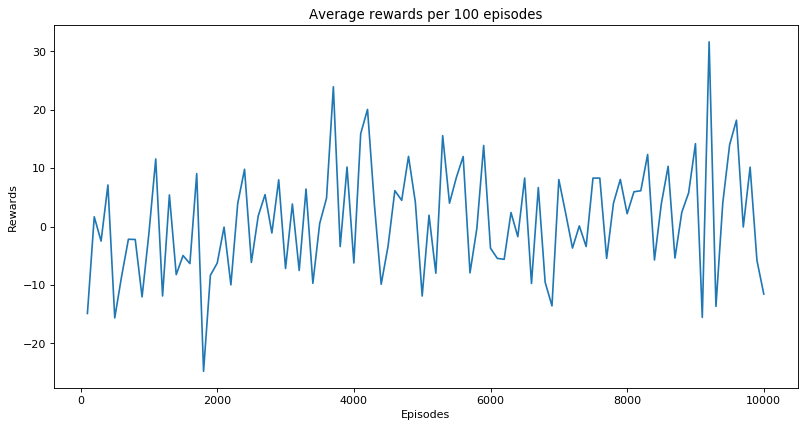

In [12]:
#Plot the average rewards per 100 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 100 episodes')
plt.plot(df['Episodes'], df['Avg_Reward'])

# Calculate Average Rewards per 50 Episodes

In [13]:
sum_rewards = 0
avg_rewards_per_50 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%50) == 0 :
        avg_rewards_per_50.append(sum_rewards/50)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%50==0):
            break
        else:
            avg_rewards_per_50.append(sum_rewards/(i%50))
        

len(avg_rewards_per_50)

200

In [14]:
df_50 = pd.DataFrame()
df_50 = df_50.fillna(0)
df_50['Avg_Reward'] = avg_rewards_per_50
df_50['Episodes'] = (df_50.index+1)*50
df_50

,Avg_Reward,Episodes
0,-32.18,50
1,2.38,100
2,1.94,150
3,1.40,200
4,-5.84,250
...,...,...
195,9.74,9800
196,9.58,9850
197,-21.20,9900
198,6.34,9950


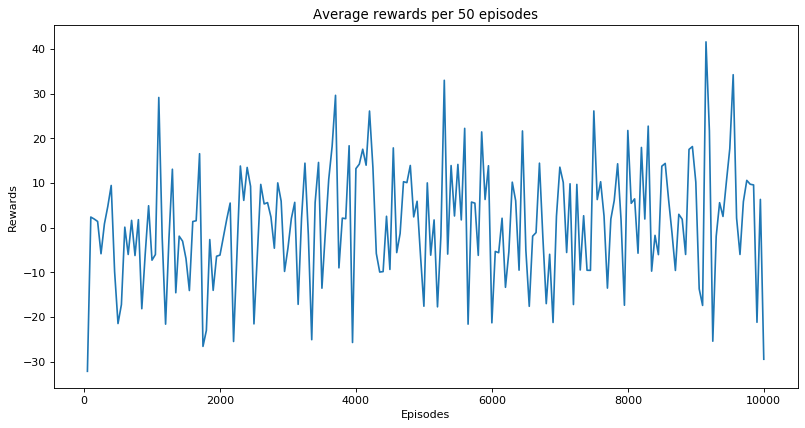

In [15]:
#Plot the average rewards per 50 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 50 episodes')
plt.plot(df_50['Episodes'], df_50['Avg_Reward'])

# Calculate Average Rewards per 10 Episodes

In [16]:
sum_rewards = 0
avg_rewards_per_10 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%10) == 0 :
        avg_rewards_per_10.append(sum_rewards/10)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%10==0):
            break
        else:
            avg_rewards_per_10.append(sum_rewards/(i%10))
        
avg_rewards_per_10

len(avg_rewards_per_10)

1000

In [17]:
df_10 = pd.DataFrame()
df_10 = df_10.fillna(0)
df_10['Avg_Reward'] = avg_rewards_per_10
df_10['Episodes'] = (df_10.index+1)*10
df_10

,Avg_Reward,Episodes
0,-105.8,10
1,-90.4,20
2,-30.1,30
3,51.5,40
4,13.9,50
...,...,...
995,-26.4,9960
996,-25.7,9970
997,-5.3,9980
998,-45.2,9990


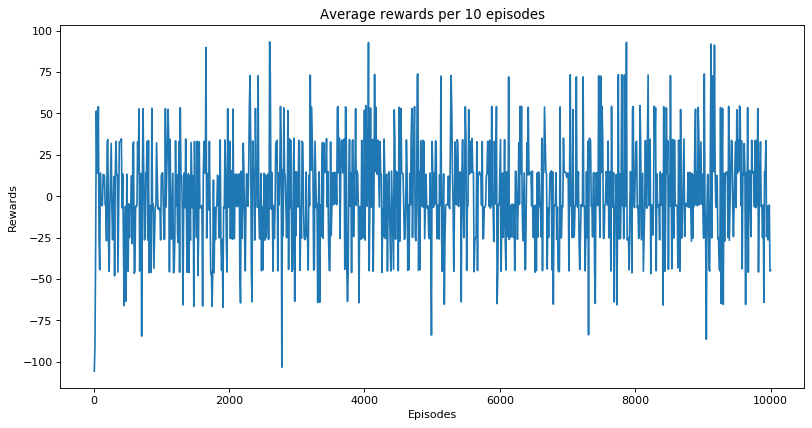

In [18]:
#Plot the average rewards per 10 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 10 episodes')
plt.plot(df_10['Episodes'], df_10['Avg_Reward'])

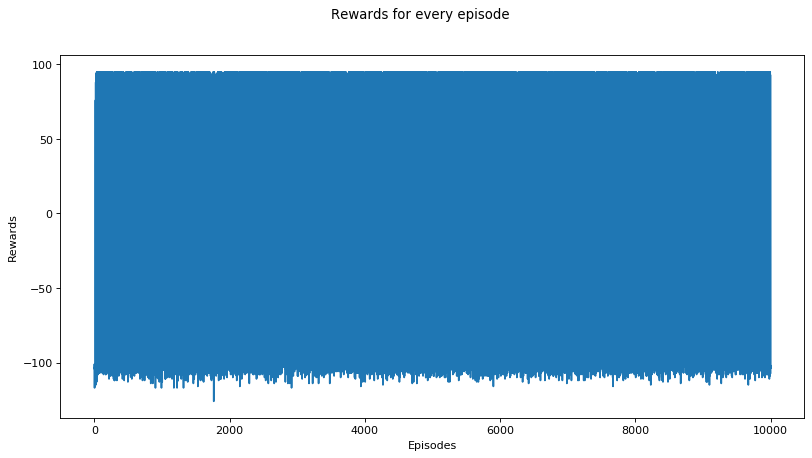

In [19]:
#%% Plot the reward for every episode
reward_per_episode = pd.DataFrame(np.asarray(episodes_rewards_list)) 
reward_per_episode['episodes'] = reward_per_episode.index
reward_per_episode.columns = ['total_reward', 'episodes']


plt.figure(figsize=(12, 6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.suptitle('Rewards for every episode')
plt.plot(reward_per_episode['episodes'], reward_per_episode['total_reward'])